Final Project Submission

* Student name: Jenny Kreiger
* Student pace: full time
* Scheduled project review date/time: Tuesday, 09/10/19, 09:00 PDT
* Instructor name: Victor Geislinger
* Blog post URL: TBD

# Introduction: Pricing midrange homes in King County, WA

In recent years King County, WA, has seen cost of living climb well above state and national averages, and the high cost of housing is a major factor in this increase. A [news article published by the University of Washington](https://www.washington.edu/news/2017/10/11/in-seattle-cost-of-meeting-basic-needs-up-30000-in-a-decade/) in 2017 reported that the cost of basic living essentials for a family of four in Seattle had increased by $30,000 (62\%) over the previous decade, with housing and childcare eating up half of a family's budget.

For middle-income families, home ownership can be a path to building wealth. How can a family maximize the return on their investment in home ownership? What factors affect the selling prices of midrange homes? What can homeowners do to increase the value of their homes while they occupy them? 

This project will address these questions using data from the King County Housing dataset. To make the results more relevant to middle-income families, the focus will be on houses with two to five bedrooms and with a median price of $425,000.* The top 10% most expensive houses will be omitted. The resulting model will help middle-income families understand how changes within their reach, like adding a bedroom or remodeling a bathroom, can increase the sale price of their homes.

*_Assuming excellent credit, a down-payment of 14\%, and the ability to spend about 1/3 of monthly gross income on a mortgage payment, \\$425,000 would be an affordable home price for a family making [King County's median household income of \$89,675](https://www.deptofnumbers.com/income/washington/king-county/). I used [NerdWallet's mortgage calculator](https://www.nerdwallet.com/mortgages/mortgage-calculator/calculate-mortgage-payment/washington) to estimate this._

# Exploring the whole dataset

To get a sense for the what is in the King County Housing dataset, first I will do some basic exploration of the entire dataset. After cleaning, another round of exploration will help clarify trends in the data specific to midrange housing.

First, I import the packages and data and take a look at the first few rows to see what's there.

In [1]:
# Import needed packages and read in the data
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

data = pd.read_csv('kc_house_data.csv')

In [2]:
# View first few rows of the dataset
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


Already I can see that there is some data that may not be useful at all. `id` appears to be a unique identifying number for each sale record. `sqft_living` appears to be the sum of `sqft_above` and `sqft_basement`. I can also see some missing values. 

Let's check for missing values throughout the dataset.

## Are there any missing values or duplicate observations?

Missing values can cause problems when it comes time to build my regression model, so I want to be sure to find and resolve them. If there are any duplicate observations, I will want to remove those.

First, let's check for missing values in each column.

In [3]:
# View counts and data types by column
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(11), object(2)
memory usage: 3.5+ MB


Above I can see that there are a few columns with missing values (and some whose data types may need to be changed).

There's a more direct way to see how many missing values there are and where:

In [4]:
# Check for missing values by column
data.isna().sum()

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

It looks like there are a lot of missing values in `waterfront` and `yr_renovated` and a few in `view`. These can be filled during the cleaning phase.

Let's check for duplicate observations. I'll do this two ways: first by searching for observations that are completely identical, and then by searching for duplicate values in the `id` column, since I believe that to be a unique identifier for each home sale.

In [5]:
# Check for duplicate records
print('Number of duplicate records: ', sum(data.duplicated()))

Number of duplicate records:  0


In [6]:
# Check for duplicate IDs
display(data['id'].value_counts().head())

# Count non-unique IDs
id_value_counts = data['id'].value_counts()
num_repeat_ids = len(id_value_counts[id_value_counts > 1])*2 + 1
print('Number of non-unique IDs: ', num_repeat_ids)

795000620     3
1825069031    2
2019200220    2
7129304540    2
1781500435    2
Name: id, dtype: int64

Number of non-unique IDs:  353


I can see both from the value counts and from my calculation that there are a number of non-unique values in the `id` column, but these are few in relation to the overall size of the dataset.

If the records are not identical, and just the `id`s are repeated, how are these records different from one another?

In [7]:
# Inspect a few of the records with duplicate IDs
display(data[data['id'] == 795000620])
display(data[data['id'] == 1825069031])
# display(data[data['id'] == 2019200220])
# display(data[data['id'] == 7129304540])
# display(data[data['id'] == 1781500435])

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
17588,795000620,9/24/2014,115000.0,3,1.0,1080,6250,1.0,0.0,0.0,...,5,1080,0.0,1950,0.0,98168,47.5045,-122.33,1070,6250
17589,795000620,12/15/2014,124000.0,3,1.0,1080,6250,1.0,0.0,0.0,...,5,1080,0.0,1950,0.0,98168,47.5045,-122.33,1070,6250
17590,795000620,3/11/2015,157000.0,3,1.0,1080,6250,1.0,NaN,0.0,...,5,1080,0.0,1950,NaN,98168,47.5045,-122.33,1070,6250


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
3946,1825069031,8/14/2014,550000.0,4,1.75,2410,8447,2.0,0.0,3.0,...,8,2060,350.0,1936,1980.0,98074,47.6499,-122.088,2520,14789
3947,1825069031,10/16/2014,550000.0,4,1.75,2410,8447,2.0,NaN,3.0,...,8,2060,350.0,1936,1980.0,98074,47.6499,-122.088,2520,14789


On inspection, I can see that the observations really are different even when the `id` value is the same: different dates, different prices, etc. Since I expect to drop the `id` column before modeling anyway, I will leave these observations in the dataset and assume that they represent different sales of the same house or some other meaningful difference.

## Are any of the variables categorical?

Categorical values can interfere with modeling if they are not handled correctly, so it is important to identify them early on. I'll use four approaches: viewing summary statistics, counting unique values, looking and histograms, and looking at scatter plots.

First, let's view summary statistics for each of the numeric columns and see if any of them have particularly small ranges, perhaps made up of mostly integers. (This is also a good opportunity to get a feel for the distributions of all the numeric variables.)

In [8]:
# Check summary statistics of numeric columns
data.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,19221.000000,21534.000000,21597.000000,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007596,0.233863,3.409825,7.657915,1788.596842,1970.999676,83.636778,98077.951845,47.560093,-122.213982,1986.620318,12758.283512
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086825,0.765686,0.650546,1.173200,827.759761,29.375234,399.946414,53.513072,0.138552,0.140724,685.230472,27274.441950
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


UPDATE THIS: It is clear from the results that there are some wide ranges in some columns. `price`, for example, ranges from \$78,000 to over \\$7 million, and `sqft_living` from 370 to over 13,000 square feet. Other variables appear to be categorical, such as `view` and `condition`, where there seem to be few unique values representing levels of quality rather than some truly quantitative measure.

Let's check the number of unique values in each column to see if we find any other potential categorical variables.

In [9]:
# Check the number of unique values in each column
unique_vals_list = []
for col in data.columns:
    unique_vals_list.append({'column': col, 'unique values': len(data[col].unique())})
pd.DataFrame(unique_vals_list)

,column,unique values
0,id,21420
1,date,372
2,price,3622
3,bedrooms,12
4,bathrooms,29
5,sqft_living,1034
6,sqft_lot,9776
7,floors,6
8,waterfront,3
9,view,6


UPDATE THIS: It is clear that `floors`, `waterfront`, `view`, and `condition` have few unique values (and we have already seen that some of those values are missing anyway). `bedrooms` and `grade` might also be good candidates for one-hot encoding after we have narrowed the dataset to just the midrange homes.

Now let's check the histograms:

In [10]:
# Define a function to create histograms
def hist_it(data):
    
    """Creates histograms of all numeric columns in a DataFrame"""
    
    data.hist(figsize=(16,14))

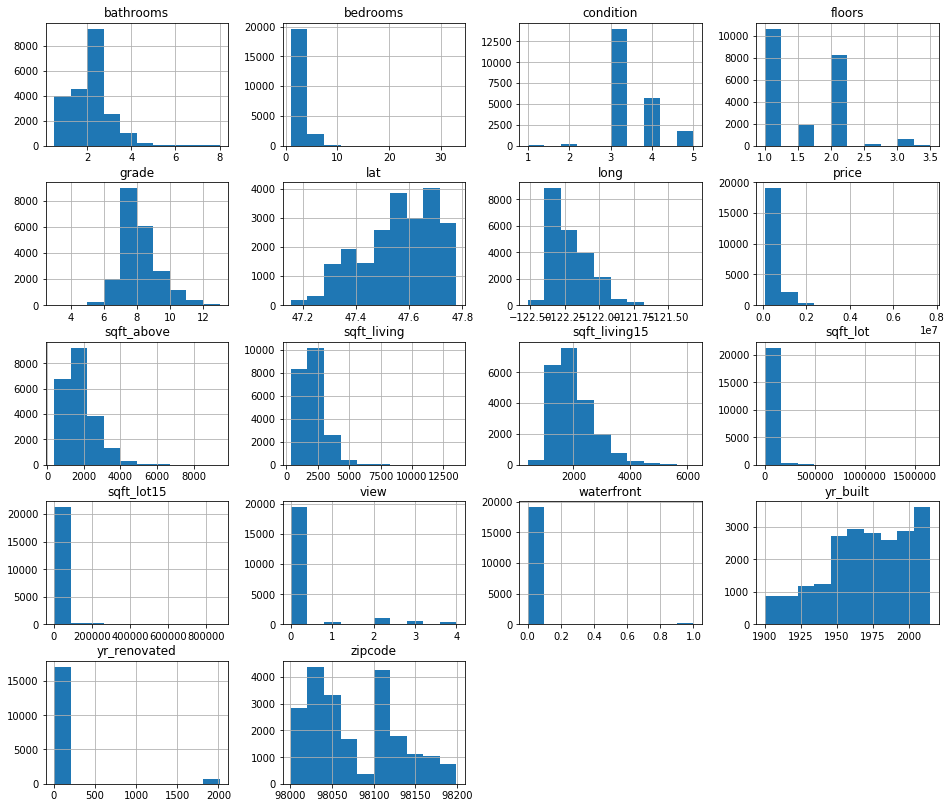

In [11]:
# Create histograms for numerical variables
data_for_hist = data.drop(['id'], axis=1)

hist_it(data_for_hist)

And the scatter plots. Coincidentally, the scatter matrix below will let us do an initial check for linear relationships between the independent variables and the target of our analysis, `price`.

In [12]:
# Create a scatter_matrix to look for categorical variables and linear relationships
# pd.plotting.scatter_matrix(data.drop(['id'], axis=1), figsize=[16,14]);

Based on the plots, value counts, and summary statistics, I think that `floors`, `waterfront`, `view`, `condition`,  and `grade` may all be candidates for one-hot encoding in the final dataset. The summary statistics showed that, although most `bedrooms` values are under 5, there is at least one very high value (33). Because the final dataset will be limited to homes with 2 to 5 bedrooms, I will treat `bedrooms` as a categorical variable for modeling purposes.

## Are any of the independent variables strongly correlated with each other?

Multicollinearity (when two or more independent variables are strongly correlated with each other) can cause a model to appear better than it really is; those correlations amplify the effects of the correlated features. If such correlations are found, one variable from each correlated pair can be dropped from the model to counteract the effect of multicollinearity.

I will check for correlations among the features using a correlation matrix and a heatmap, below, and using 0.8 as the threshold for "strong" correlation.

In [13]:
# Create a boolean correlation matrix to highlight strong correlations
abs(data.corr()) > 0.8

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
id,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
price,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
bedrooms,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
bathrooms,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
sqft_living,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,False,False,False
sqft_lot,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False
floors,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
waterfront,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False
view,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False
condition,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False


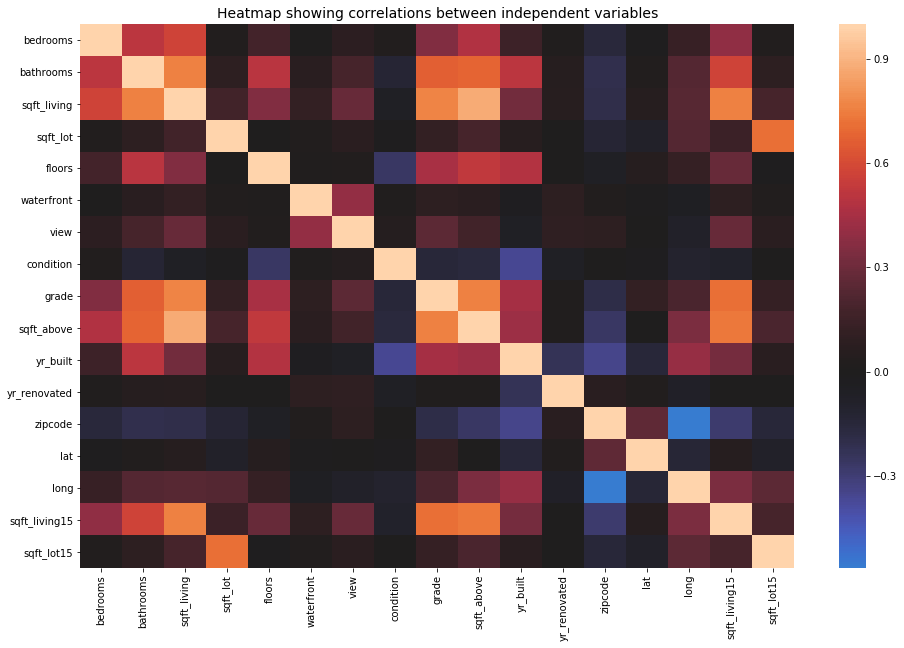

In [14]:
# Create the correlation heatmap
data_for_scatter_matrix = data.drop(['price', 'id'], axis=1)

plt.figure(figsize=(16,10))
sns.heatmap(data_for_scatter_matrix.corr(), center=0)
plt.title('Heatmap showing correlations between independent variables', fontsize=14)
plt.show();

The only pair of features with a correlation coefficient of 0.8 or above is `sqft_living` and `sqft_above`. As stated earlier, `sqft_living` is the sum of `sqft_above` and `sqft_basement`, so `sqft_above` will be dropped from the dataset anyway, avoiding any potential effects caused by multicollinearity.

# Initial cleaning

Now that we have seen the basic characteristics of the whole dataset, it is time to trim it down to the part that is most relevant to middle-income families: houses with 2 to 5 bedrooms, and _not_ in the top 10\% by price. This is also the time to resolve any missing values, drop unneeded columns, and then reexamine the data visually to understand the characteristics of our more focused dataset.

These are the main cleaning steps I will take:
* Filter the dataset to observations with 2-5 bedrooms.
* Filter the dataset to observations with price below the 90th percentile.
* Resolve missing values in the `waterfront`, `view`, and `yr_renovated` columns.
* Calculate a new column, `month`, from the date column.
* Drop the following columns: `id`, `date`, `sqft_above`, `sqft_basement`.

### Filter to focus on midrange homes

First, let's focus in on the midrange homes by filtering out the biggest and most expensive ones.

In [15]:
# Filter the dataset
midrange_homes = data[(data['price'] < np.quantile(data['price'], 0.9)) 
                         & (data['bedrooms'].isin(range(2, 6)))]

# View the first few rows
midrange_homes.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


Let's check the effect of our filtering by looking at the summary statistics again:

In [16]:
midrange_homes.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,1.899900e+04,18999.000000,18999.000000,18999.000000,18999.000000,1.899900e+04,18999.000000,16906.000000,18943.000000,18999.000000,18999.000000,18999.000000,18999.000000,15614.000000,18999.000000,18999.000000,18999.000000,18999.000000,18999.000000
mean,4.623793e+09,451033.600453,3.285910,2.012816,1912.888047,1.413348e+04,1.463682,0.002189,0.145331,3.405127,7.464498,1659.656298,1971.048424,66.947931,98078.543344,47.553219,-122.212729,1882.645929,12188.540871
std,2.878978e+09,177148.927445,0.782848,0.672443,706.241075,3.852339e+04,0.536461,0.046732,0.582127,0.643411,0.959870,671.456125,28.847826,359.290326,53.294178,0.143337,0.142935,574.261538,25473.821194
min,1.200019e+06,78000.000000,2.000000,0.500000,440.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,4.000000,440.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.154950e+09,310000.000000,3.000000,1.500000,1380.000000,5.000000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1160.000000,1952.000000,0.000000,98033.000000,47.451150,-122.330000,1460.000000,5040.000000
50%,3.943600e+09,425000.000000,3.000000,2.000000,1810.000000,7.486000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1480.000000,1975.000000,0.000000,98065.000000,47.562200,-122.233000,1780.000000,7515.000000
75%,7.350400e+09,570000.000000,4.000000,2.500000,2340.000000,1.015000e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2030.000000,1996.000000,0.000000,98118.000000,47.680700,-122.122000,2230.000000,9750.000000
max,9.900000e+09,886000.000000,5.000000,5.000000,5820.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,12.000000,5450.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,4670.000000,560617.000000


Bedrooms now range from 2 to 5, and the median price is now \$425,000.

Let's check again for missing values; some may have been eliminated by the filtering.

In [17]:
# Check for missing values by column
midrange_homes.isna().sum()

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2093
view               56
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3385
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

### Resolve missing values

#### `waterfront`

I can see above that there are still 2,093 missing values in the `waterfront` column. I'll investigate further.

In [18]:
# View value counts for 'waterfront'
midrange_homes['waterfront'].value_counts()

0.0    16869
1.0       37
Name: waterfront, dtype: int64

Out of about 19,000 observations, only 37 have a value of 1 (presumably meaning "yes") in the `waterfront` column. If we take a quick look at median prices of homes with `waterfront == 1` versus those where it equals 0...

In [19]:
print(midrange_homes[midrange_homes['waterfront'] == 1]['price'].median())
print(midrange_homes[midrange_homes['waterfront'] == 0]['price'].median())

635000.0
425000.0


...it is clear that waterfront probably has a pretty strong effect on price, but the vast majority of houses are not experiencing this effect. For this reason, I will fill missing `waterfront` values with 0, assuming that when the creators of this dataset left a value blank, the property was probably not on the waterfront anyway.

In [20]:
# Fill NaNs with 0.0 because it is by far the more common value
midrange_homes['waterfront'] = midrange_homes['waterfront'].fillna(0.0)
midrange_homes['waterfront'] = midrange_homes['waterfront'].astype('int64')
midrange_homes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18999 entries, 0 to 21596
Data columns (total 21 columns):
id               18999 non-null int64
date             18999 non-null object
price            18999 non-null float64
bedrooms         18999 non-null int64
bathrooms        18999 non-null float64
sqft_living      18999 non-null int64
sqft_lot         18999 non-null int64
floors           18999 non-null float64
waterfront       18999 non-null int64
view             18943 non-null float64
condition        18999 non-null int64
grade            18999 non-null int64
sqft_above       18999 non-null int64
sqft_basement    18999 non-null object
yr_built         18999 non-null int64
yr_renovated     15614 non-null float64
zipcode          18999 non-null int64
lat              18999 non-null float64
long             18999 non-null float64
sqft_living15    18999 non-null int64
sqft_lot15       18999 non-null int64
dtypes: float64(7), int64(12), object(2)
memory usage: 3.2+ MB


/Users/jennykreiger/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/jennykreiger/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


#### `view`

The documentation for this dataset is not very clear on what `view` represents. It seems likely, given what little has been said about it, that `view` gives some indication of whether or how much a home was viewed prior to sale. Because the maximum value of `view` is only 4, it seems likely that this is not an absolute count, but perhaps some kind of "index" or "tier" of how much viewing went on (i.e., a categorical variable). Since it is not possible to ask the creators of the dataset for clarification, I will treat `view` as a categorical variable representing how much a house was viewed prior to sale, with "0" meaning "little to none" and "4" meaning "a lot." If we take a quick look at the distribution of values in `view`...

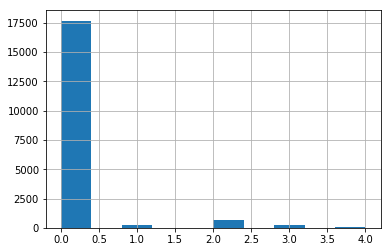

In [21]:
midrange_homes['view'].hist();

...we can see that mode of values in this column is "0" by a long shot. We can see from the summary statistics table (above) that 0 is also the minimum value, the 25th percentile, the median, and the 75% percentile. For these reasons, I will reassign all missing values to 0, since it seems likely that many of the missing values would have been 0 had they been recorded.

In [22]:
# Fill NaNs with 0.0 and check that missing `view` values are now resolved
midrange_homes['view'] = midrange_homes['view'].fillna(0.0).astype('int64')
midrange_homes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18999 entries, 0 to 21596
Data columns (total 21 columns):
id               18999 non-null int64
date             18999 non-null object
price            18999 non-null float64
bedrooms         18999 non-null int64
bathrooms        18999 non-null float64
sqft_living      18999 non-null int64
sqft_lot         18999 non-null int64
floors           18999 non-null float64
waterfront       18999 non-null int64
view             18999 non-null int64
condition        18999 non-null int64
grade            18999 non-null int64
sqft_above       18999 non-null int64
sqft_basement    18999 non-null object
yr_built         18999 non-null int64
yr_renovated     15614 non-null float64
zipcode          18999 non-null int64
lat              18999 non-null float64
long             18999 non-null float64
sqft_living15    18999 non-null int64
sqft_lot15       18999 non-null int64
dtypes: float64(6), int64(13), object(2)
memory usage: 3.2+ MB


/Users/jennykreiger/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


#### `yr_renovated`

From the histogram, it is clear that most `yr_renovated` values are 0. I assume this means that a house has not had substantial renovation since its construction.

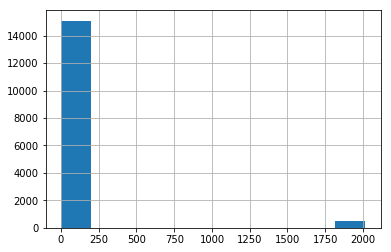

In [23]:
# Check value counts in 'yr_renovated'
midrange_homes['yr_renovated'].hist();

Since 0 is the mode, I will replace the missing values with 0:

In [24]:
# Fill NaNs with 0 and cast to dtype 'int64'
midrange_homes['yr_renovated'] = midrange_homes['yr_renovated'].fillna(0)
midrange_homes['yr_renovated'] = midrange_homes['yr_renovated'].astype('int64')

# Confirm that all missing values have been resolved
midrange_homes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18999 entries, 0 to 21596
Data columns (total 21 columns):
id               18999 non-null int64
date             18999 non-null object
price            18999 non-null float64
bedrooms         18999 non-null int64
bathrooms        18999 non-null float64
sqft_living      18999 non-null int64
sqft_lot         18999 non-null int64
floors           18999 non-null float64
waterfront       18999 non-null int64
view             18999 non-null int64
condition        18999 non-null int64
grade            18999 non-null int64
sqft_above       18999 non-null int64
sqft_basement    18999 non-null object
yr_built         18999 non-null int64
yr_renovated     18999 non-null int64
zipcode          18999 non-null int64
lat              18999 non-null float64
long             18999 non-null float64
sqft_living15    18999 non-null int64
sqft_lot15       18999 non-null int64
dtypes: float64(5), int64(14), object(2)
memory usage: 3.2+ MB


/Users/jennykreiger/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/jennykreiger/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


### Create the 'month' column

I want to have the option to explore seasonality in sale prices. Since the dataset comes from 2014-2015 and I want to be able to generalize to other years, I will focus on the month in which each sale was made. I will extract the number of the month from each date into a new column.

In [25]:
# Create 'month' column
midrange_homes['month'] = [x.split('/')[0] for x in midrange_homes['date']]
midrange_homes['month'] = pd.to_numeric(midrange_homes['month'], 
                                        errors='coerce')

# Confirm that 'month' exists and is numeric
midrange_homes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18999 entries, 0 to 21596
Data columns (total 22 columns):
id               18999 non-null int64
date             18999 non-null object
price            18999 non-null float64
bedrooms         18999 non-null int64
bathrooms        18999 non-null float64
sqft_living      18999 non-null int64
sqft_lot         18999 non-null int64
floors           18999 non-null float64
waterfront       18999 non-null int64
view             18999 non-null int64
condition        18999 non-null int64
grade            18999 non-null int64
sqft_above       18999 non-null int64
sqft_basement    18999 non-null object
yr_built         18999 non-null int64
yr_renovated     18999 non-null int64
zipcode          18999 non-null int64
lat              18999 non-null float64
long             18999 non-null float64
sqft_living15    18999 non-null int64
sqft_lot15       18999 non-null int64
month            18999 non-null int64
dtypes: float64(5), int64(15), object(2)
me

/Users/jennykreiger/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/jennykreiger/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


### Drop unneeded columns

I have decided to drop the following columns for the reasons given below:
* `id`: The values in this column simply identify each observation, and I don't expect them to be useful for modeling.
* `date`: The whole date is not analytically interesting to me, but the month is, so I extracted that data to a separate column.
* `sqft_above` and `sqft_basement`: As stated above, `sqft_living` appears to be the sum of these two values. Since there is not much a homeowner could do to shift the balance of 'above' space to basement, I don't expect these features to be useful for my model.

In [26]:
# Drop unneeded columns
midrange_homes.drop(['id', 'date', 'sqft_above', 'sqft_basement'], 
                    axis=1, inplace=True)

# Review the remaining columns
midrange_homes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18999 entries, 0 to 21596
Data columns (total 18 columns):
price            18999 non-null float64
bedrooms         18999 non-null int64
bathrooms        18999 non-null float64
sqft_living      18999 non-null int64
sqft_lot         18999 non-null int64
floors           18999 non-null float64
waterfront       18999 non-null int64
view             18999 non-null int64
condition        18999 non-null int64
grade            18999 non-null int64
yr_built         18999 non-null int64
yr_renovated     18999 non-null int64
zipcode          18999 non-null int64
lat              18999 non-null float64
long             18999 non-null float64
sqft_living15    18999 non-null int64
sqft_lot15       18999 non-null int64
month            18999 non-null int64
dtypes: float64(5), int64(13)
memory usage: 2.8 MB


/Users/jennykreiger/anaconda3/envs/learn-env/lib/python3.6/site-packages/pandas/core/frame.py:3697: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


A look at the `.info()` above shows that we now have 18,999 rows and 18 columns. All columns are of numeric data types, and there are no missing values.

# Exploring just the midrange homes

## General exploration

Let's revisit our histograms now that the data has been cleaned.

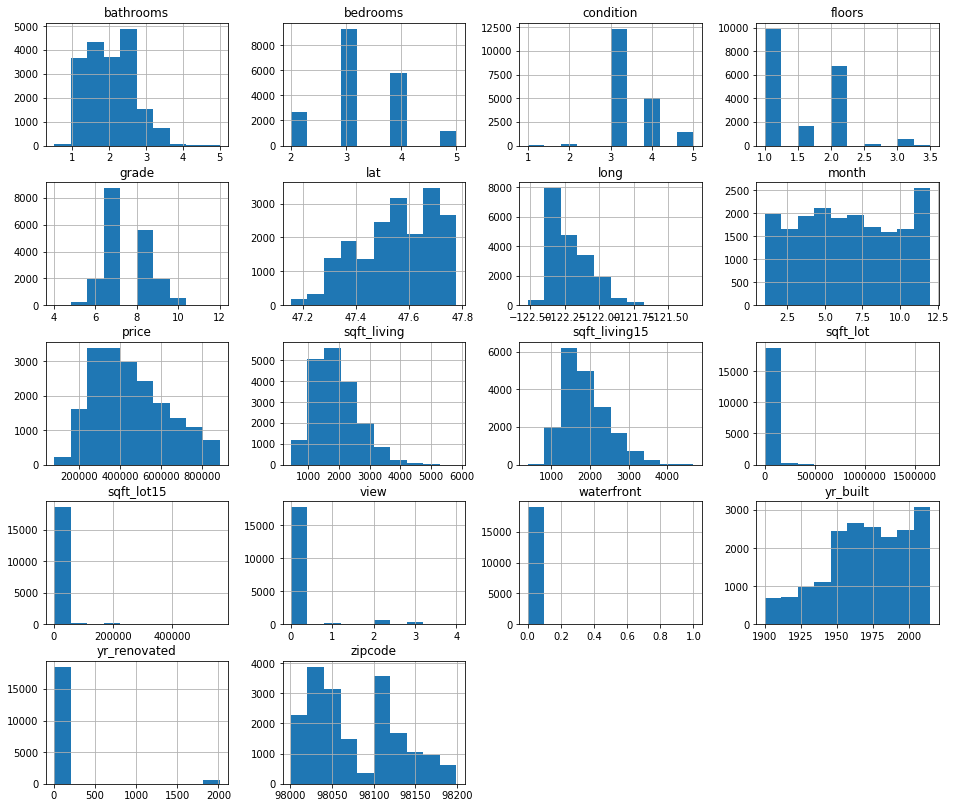

In [27]:
# Create histograms of numeric features
hist_it(midrange_homes)

Note that selecting the homes with lower prices and 2-5 bedrooms has also caused the ranges of some other variables to shrink. `grade`, for instance, now only goes up to 10, `sqft_living` to about 5,000, and `bathrooms` up to 5. Note also that there is a clear mode in `month` at the end of the year.

Now let's examine scatterplots of each feature against price:

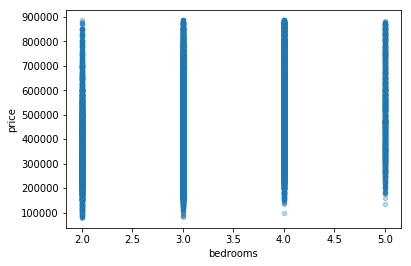

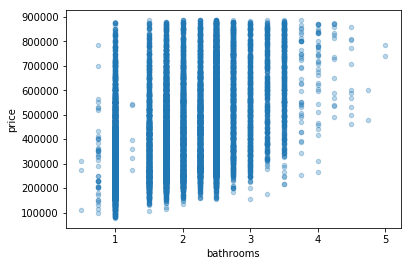

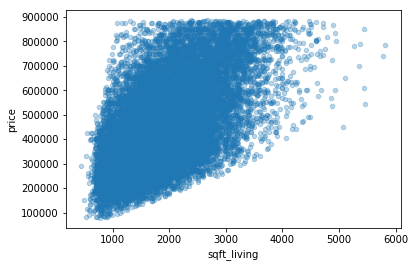

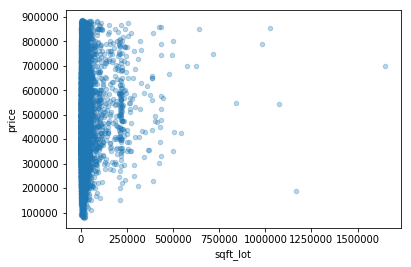

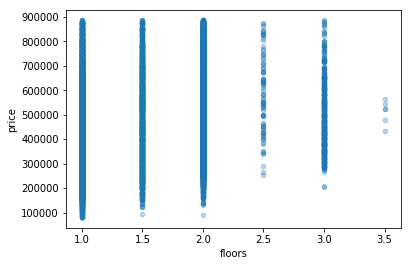

...

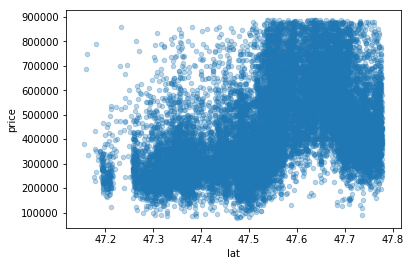

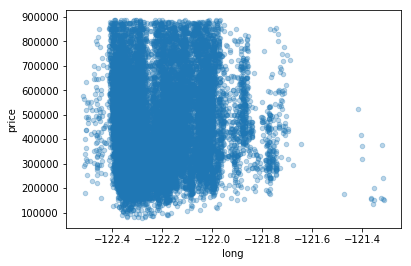

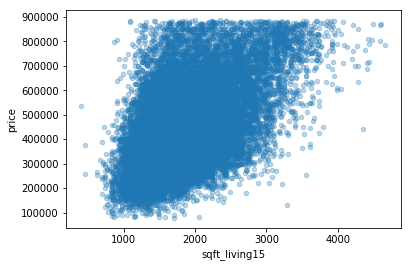

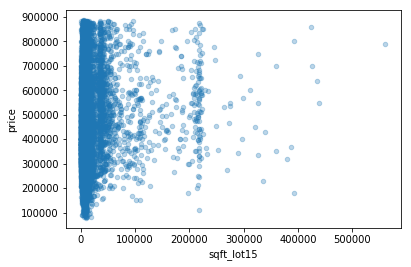

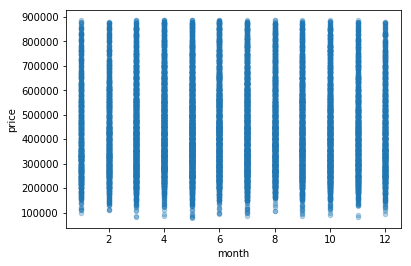

In [33]:
# Create scatterplots of all columns v. price
for column in midrange_homes.drop('price', axis=1):
    midrange_homes.plot(kind='scatter', x=column, y='price', alpha=0.3)
    plt.show();

Most features appear to have a more or less linear relationship with price. The distribution of points in `zipcode` makes me wonder if there are actually two subsets in this data: homes in the Seattle area (with zipcodes of 98100 and up), and homes elsewhere in the county. Depending on the results of my first attempt at modeling, I may decide to reexamine the effect that location may be having on the model.

Now that the dataset has been trimmed down a bit, let's re-check for multicollinearity.

In [68]:
# Create a boolean correlation matrix to highlight strong correlations
abs(midrange_homes.corr()) > 0.8

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,month
price,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
bedrooms,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
bathrooms,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
sqft_living,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False
sqft_lot,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False
floors,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
waterfront,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False
view,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False
condition,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False
grade,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False


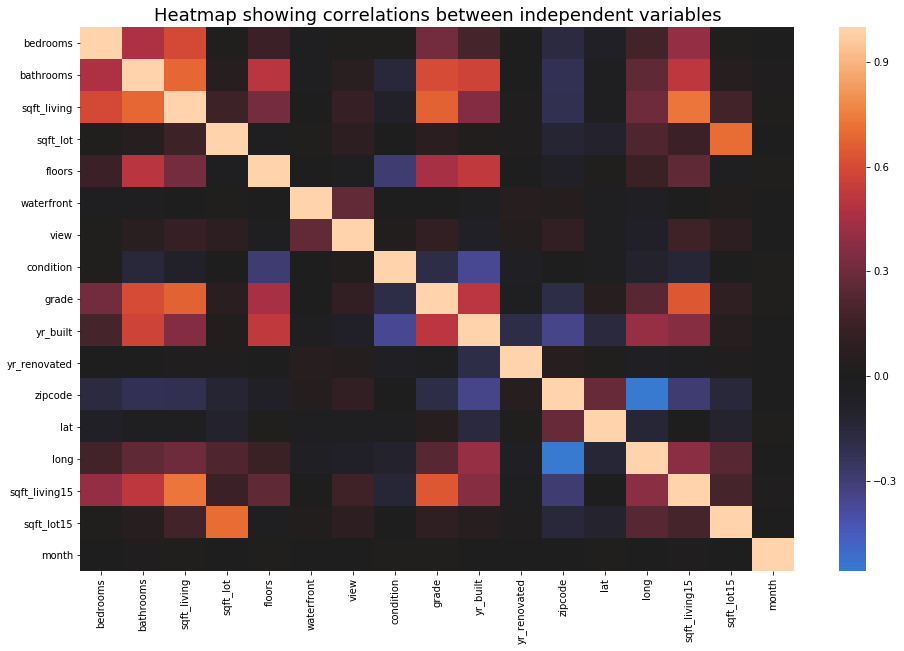

In [86]:
# Create the correlation heatmap
data_for_scatter_matrix = midrange_homes.drop(['price'], axis=1)

plt.figure(figsize=(16,10))
sns.heatmap(data_for_scatter_matrix.corr(), center=0)
plt.title('Heatmap showing correlations between independent variables', 
          fontsize=18)
plt.show();

Good news: there appear to be no correlations with coefficients higher than my chosen threshold of 0.8. 

## Specific questions

Having seen the histograms and scatterplots, I now want to examine a few features in detail to answer the following questions:
* Is there a number of bedrooms that causes a big jump up in price (e.g., three versus two, or four versus three)?
* Are there times of year when prices tend to be lower or higher?
* What is the difference in price between a home of a middling grade (e.g., 7) and one of a higher grade (e.g., 10)?

### What is the relationship between bedrooms and price?

Is there a number of bedrooms that causes a big jump up in price (e.g., three versus two, or four versus three)? Let's examine some boxplots to find out.

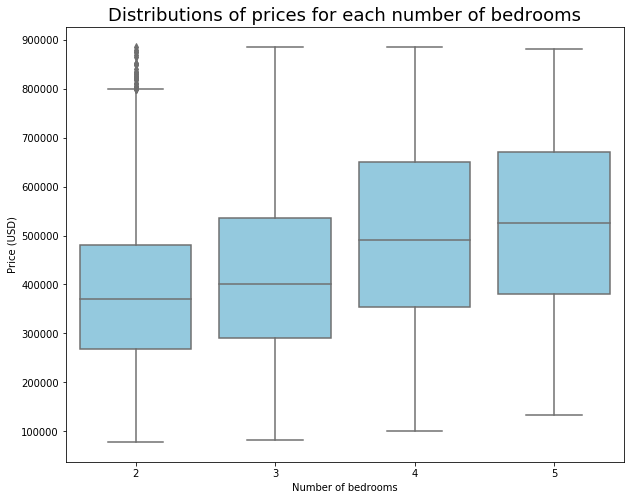

In [83]:
# Create boxplots for 'bedrooms' v. 'price'
plt.figure(figsize=(10,8))
sns.boxplot(midrange_homes['bedrooms'], midrange_homes['price'], color='skyblue')
plt.title('Distributions of prices for each number of bedrooms', fontsize=18)
plt.xlabel('Number of bedrooms')
plt.ylabel('Price (USD)')
plt.show();

In [47]:
# Calculate percent differences in median prices
medians = []

for n in range(2,6):
    medians.append(midrange_homes[midrange_homes['bedrooms'] == n]['price'].median())

percent_differences = []
for m in range(0,len(medians)-1):
    percent_differences.append(round(((medians[m+1] - medians[m]) / medians[m]),2))
    
percent_differences   

[0.08, 0.22, 0.07]

The biggest difference in median price is between four and three bedrooms (22%).

### Are there seasonal trends in price?

Are there times of year when prices tend to be lower or higher?

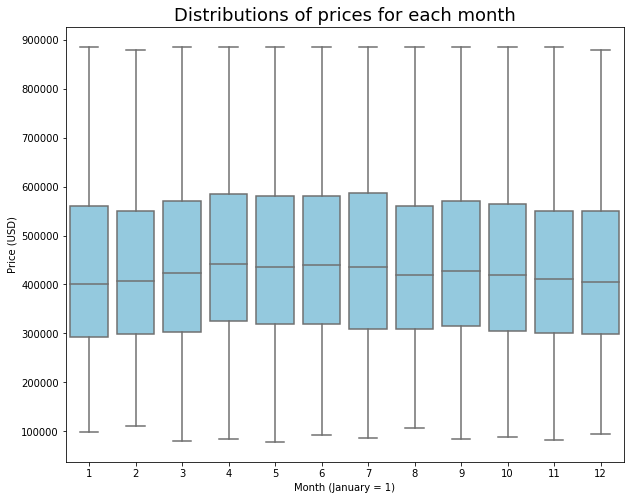

In [82]:
# Create a boxplot to compare 'month' and 'price'
plt.figure(figsize=(10,8))
sns.boxplot(midrange_homes['month'], midrange_homes['price'], color='skyblue')
plt.title('Distributions of prices for each month', fontsize=18)
plt.xlabel('Month (January = 1)')
plt.ylabel('Price (USD)')
plt.show();

Although houses sell at a wide range of prices every month, median prices appear to be higher in April through July than in November through February.

Let's compare April and January median prices directly:

In [56]:
april_med = midrange_homes[midrange_homes['month'] == 4]['price'].median()
january_med = midrange_homes[midrange_homes['month'] == 1]['price'].median()

april_med - january_med

41000.0

There is a difference in median house price of \$41,000 between April and January! Although this analysis doesn't consider any other factors (like whether houses sold in April are bigger than those sold in January), there could be an advantage to timing the sale of one's home for the spring/summer as opposed to winter.

### What is the relationship between grade and price?

What is the difference in price between a home of a middling grade (e.g., 7) and one of a higher grade (e.g., 10)?

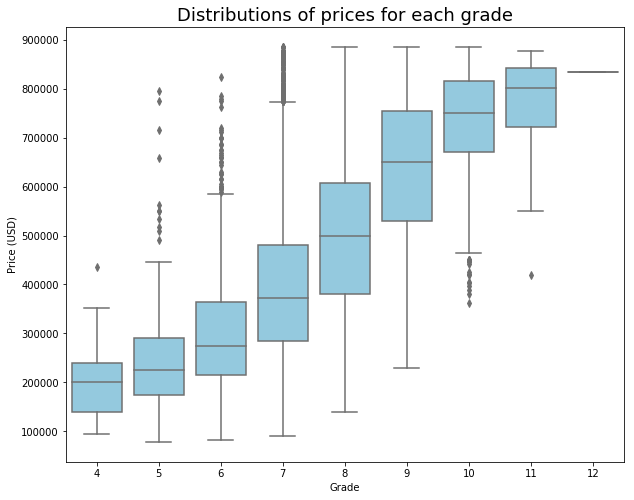

In [85]:
# Create boxplots to compare 'grade' and 'price'
plt.figure(figsize=(10,8))
sns.boxplot(midrange_homes['grade'], midrange_homes['price'], color='skyblue')
plt.title('Distributions of prices for each grade', fontsize=18)
plt.xlabel('Grade')
plt.ylabel('Price (USD)')
plt.show();

It looks like there could be substantial differences in price based on the grade of a house. For instance, only the outliers of grade-5 houses fall within the price range of grade-11 houses. 

Let's make a direct comparison between the median prices of grade-7 and grade-10 homes:

In [58]:
grade_7_med = midrange_homes[midrange_homes['grade'] == 7]['price'].median()
grade_10_med = midrange_homes[midrange_homes['grade'] == 10]['price'].median()

grade_10_med - grade_7_med

378805.0

There is a huge difference (almost \$390,000) between the median prices of grade-7 and grade-10 homes. Improving the grade of a home by that much is probably outside the reach of most homeowners. What if a homeowner could improve the grade of their home from 7 to 8?

In [59]:
grade_8_med = midrange_homes[midrange_homes['grade'] == 8]['price'].median()

grade_8_med - grade_7_med

126500.0

Based on the boxplots above, we can see that the jump in median price from grade 7 to grade 8 is a big one, but if a homeowner could manage it, it could pay off. The median price of a grade-8 home is \$126,500 higher than the median price of a grade-7 home. Again, this is without considering any other factors, like the size or condition of these homes.

### Where are the midrange homes in King County?

Because King County is home to Seattle, one of the most expensive housing markets in the US, there is probably some spatial patterning in home price, size, and quality across the county. Although a home-owning family probably cannot move their house to a new location, a family shopping for a home would probably want to know where they might find homes in their price range, or how much more house they could get by living a little farther from central Seattle. 

Let's use `lat` and `long` to take a look at where midrange homes can be found in King County.

In [105]:
# Define a function to create map-like scatter plots with color code
def locate_it(data, latitude, longitude, feature):
    
    """Create a scatterplot from lat/long data with color code
    data: a DataFrame
    latitude: the name of the column in your DataFrame that contains
    the latitude values. Pass this as a string.
    longitude: the name of the column in your DataFrame that contains
    the longitude values. Pass this as a string.
    feature: the name of the column whose values you want to use as 
    the values for your color code. Pass this as a string."""
    
    plt.figure(figsize=(16,12))
    cmap = plt.cm.get_cmap('RdYlBu')
    sc = plt.scatter(data[longitude], data[latitude], 
                     c=data[feature], vmin=min(data[feature]), 
                     vmax=max(data[feature]), alpha=0.5, s=5, cmap=cmap)
    plt.colorbar(sc)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('House {} by location'.format(feature), fontsize=18)
    plt.show();

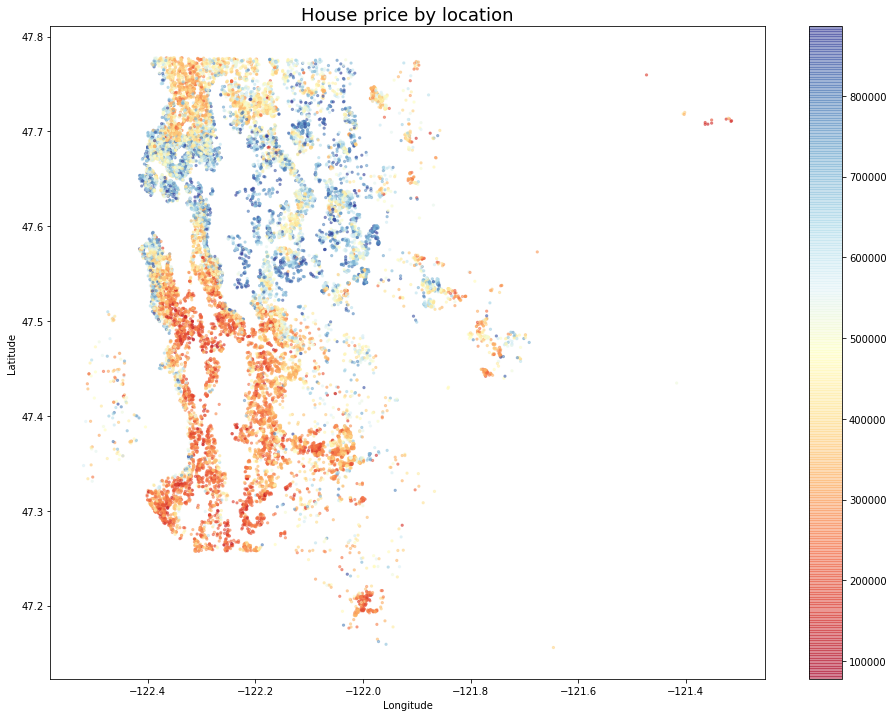

In [106]:
# Call locate_it for price by location
locate_it(midrange_homes, 'lat', 'long', 'price')

This scatterplot confirms that the most expensive midrange homes (blue dots) can be found in Seattle, around Lake Washington, and in some other waterfront locations. Less expensive homes (red dots) are concentrated in the southwest part of the county.

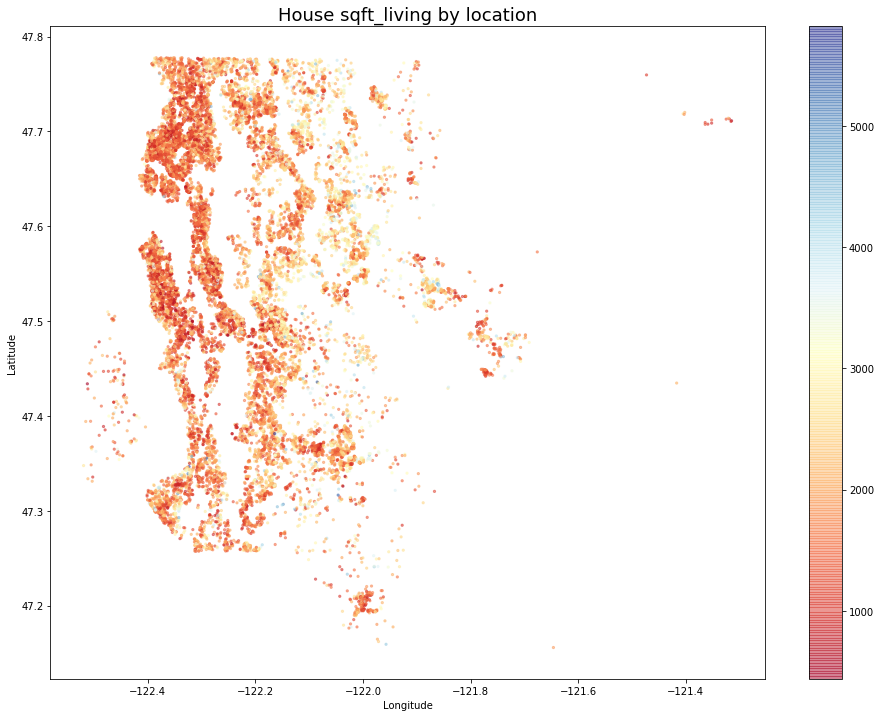

In [96]:
# Call locate_it for sqft_living by location
locate_it(midrange_homes, 'lat', 'long', 'sqft_living')

Midrange homes tend to be smaller, which is why there are so few blue dots on this plot. It's hard to understand the range of home sizes represented here, so I'll plot it again with some adjustments to the color scale.

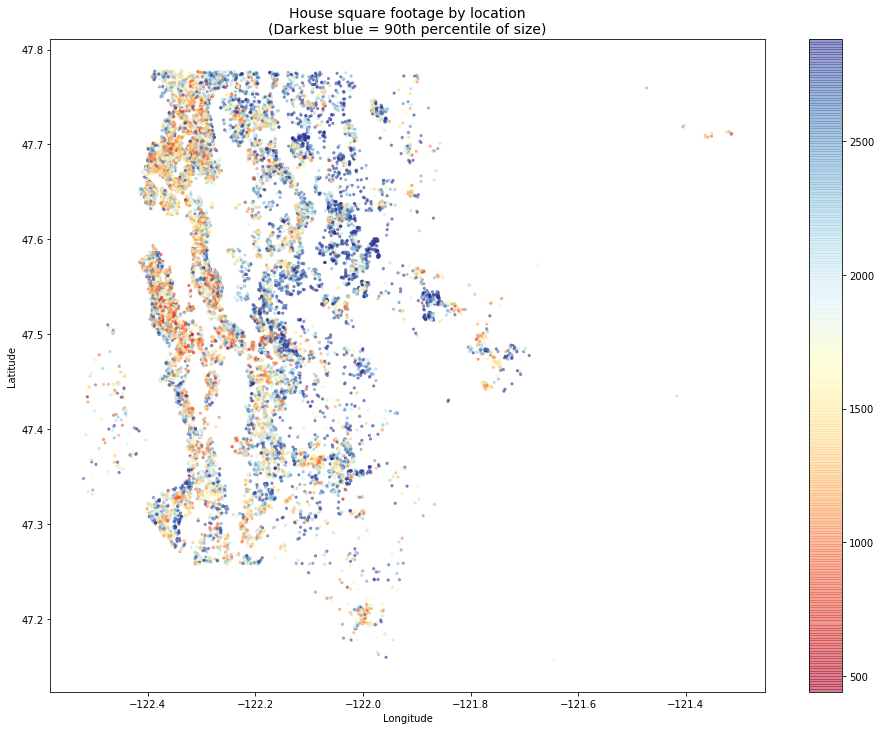

In [97]:
# Customize the plot for sqft_living by location
plt.figure(figsize=(16,12))
cmap = plt.cm.get_cmap('RdYlBu')
sc = plt.scatter(midrange_homes['long'], midrange_homes['lat'], 
                 c=midrange_homes['sqft_living'], 
                 vmin=min(midrange_homes['sqft_living']), 
                 vmax=np.percentile(midrange_homes['sqft_living'], 90), 
                 alpha=0.5, s=5, cmap=cmap)
plt.colorbar(sc)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('House square footage by location\n(Darkest blue = 90th percentile of size)', fontsize=14)
plt.show();

That's a little easier to understand. Midrange homes over 2,000 square feet can be found across much of western King County _except_ in Seattle proper, where they are less common.

What about house quality? Let's visualize homes by grade.

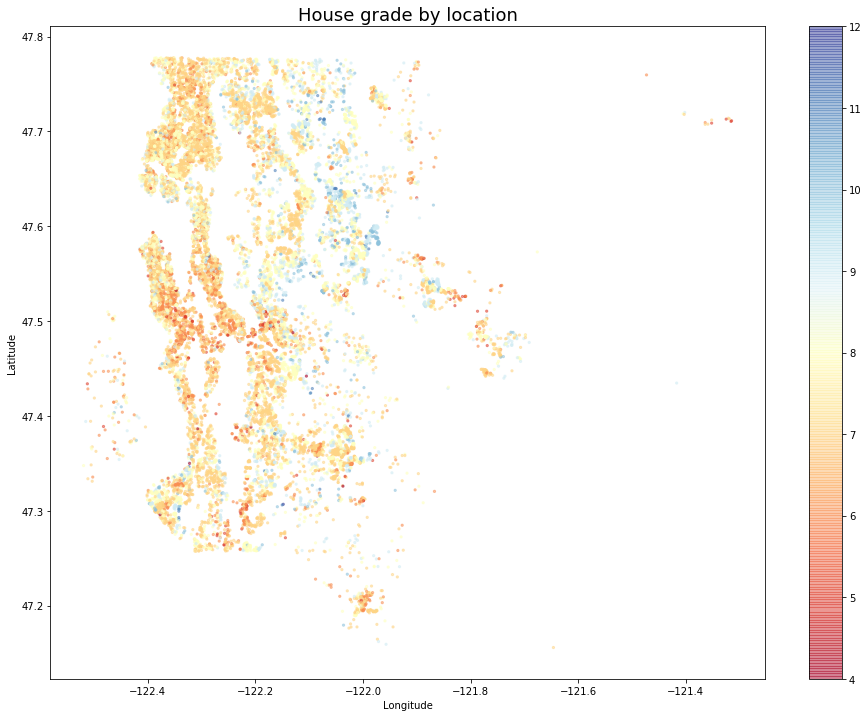

In [98]:
# Call locate_it for grade by location
locate_it(midrange_homes, 'lat', 'long', 'grade')

This plot shows that the highest quality midrange homes by grade can be found to the east of Lake Washington, while there seem to be more low-quality homes in the central and southwestern parts of the county. Overall, midrange homes tend to have grades in the middle of the range of possible values, from 6 to 10. 

Finally, let's look at the condition of midrange homes.

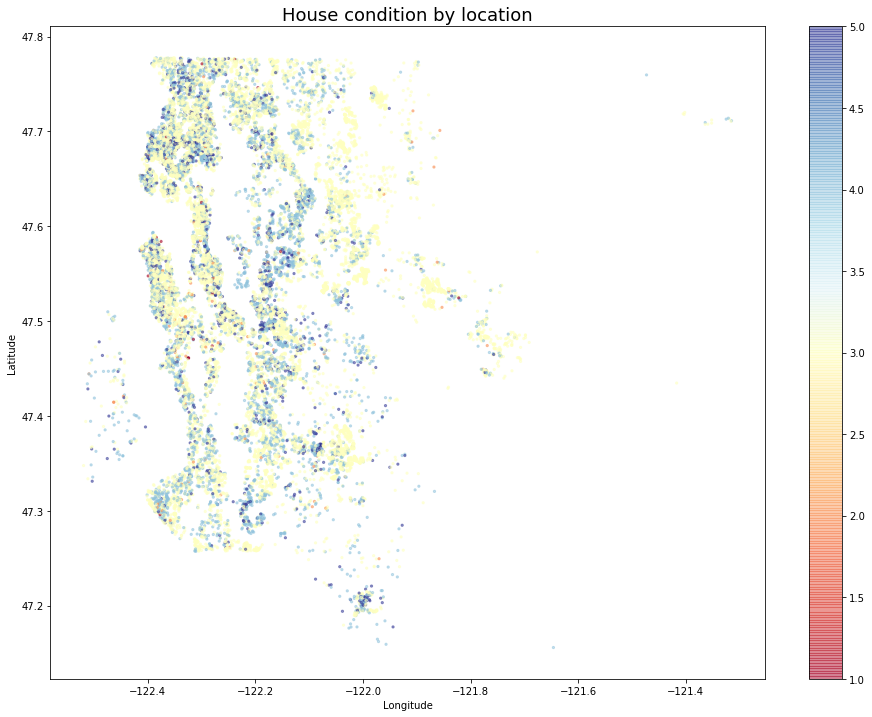

In [99]:
locate_it(midrange_homes, 'lat', 'long', 'condition')

This plot contains some good news for middle-income home buyers: homes in good condition (blue dots) can be found all over King County, and midrange homes are almost all of middling condition or better. 

# Final preprocessing

I anticipate that I may want to examine the effect that location (expressed through `zipcode`) has on price, so I'll create a copy of my `midrange_homes` DataFrame with dummy variables for the various zipcodes.

In [100]:
# Generate dummy variables
zip_dummies = pd.get_dummies(midrange_homes['zipcode'], prefix='zip')

In [101]:
# Drop the original 'zipcode' column
mh_no_zips = midrange_homes.drop('zipcode', axis=1)

# Concatenate the dummies to the copy of 'midrange_homes'
mh_zips_encoded = pd.concat([mh_no_zips, zip_dummies], axis=1)

# Preview the new DataFrame
mh_zips_encoded.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,zip_98146,zip_98148,zip_98155,zip_98166,zip_98168,zip_98177,zip_98178,zip_98188,zip_98198,zip_98199
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,...,0,0,0,0,0,0,1,0,0,0
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,...,0,0,0,0,0,0,0,0,0,0
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,...,0,0,0,0,0,0,0,0,0,0
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,...,0,0,0,0,0,0,0,0,0,0
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,...,0,0,0,0,0,0,0,0,0,0


In [102]:
# Drop one of the dummy variables
mh_zips_encoded.drop('zip_98168', axis=1, inplace=True)

# Check the head again
mh_zips_encoded.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,zip_98144,zip_98146,zip_98148,zip_98155,zip_98166,zip_98177,zip_98178,zip_98188,zip_98198,zip_98199
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,...,0,0,0,0,0,0,1,0,0,0
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,...,0,0,0,0,0,0,0,0,0,0
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,...,0,0,0,0,0,0,0,0,0,0
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,...,0,0,0,0,0,0,0,0,0,0
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,...,0,0,0,0,0,0,0,0,0,0


Once I have seen how my model performs on `midrange_homes`, I can try again with `mh_zips_encoded` to see if treating zipcode as a categorical variable improves model performance.

# Creating the model

## First model

Working on the data in `midrange_homes`, I will use multiple linear regression to try to create a model that explains at least 70% of the variability in price.

In [60]:
# Import statsmodels
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [61]:
# Split the cleaned data into features and target
mh_features = midrange_homes.drop(['price'], axis=1)
mh_target = midrange_homes['price']

In [65]:
# Define a function to run OLS and return model summary
def model_it(data, features):
    
    """Fit an OLS model and return model summary
    data: a DataFrame containing both features and target
    features: identical to 'data', but with the target dropped"""
    
    features_sum = '+'.join(features.columns)
    formula = 'price' + '~' + features_sum

    model = ols(formula=formula, data=data).fit()
    return model.summary()

In [66]:
# Fit the model and return summary
model_it(midrange_homes, mh_features)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.675
Model:                            OLS   Adj. R-squared:                  0.675
Method:                 Least Squares   F-statistic:                     2321.
Date:                Fri, 30 Aug 2019   Prob (F-statistic):               0.00
Time:                        07:36:05   Log-Likelihood:            -2.4587e+05
No. Observations:               18999   AIC:                         4.918e+05
Df Residuals:                   18981   BIC:                         4.919e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept      -7.49e+06   1.55e+06     -4.821      0.000   -1.05e+07   -4.44e+06
bedrooms      -1.008e+04   1207.012     -8.348      0.000   -1.24e+04   -7710.502
bathrooms      2.375e+04   1826.116     13.007      0.000    2.02e+04    2.73e+04
sqft_living      63.4068      2.078     30.516      0.000      59.334      67.480
sqft_lot          0.2123      0.027      7.848      0.000       0.159       0.265
floors         3.061e+04   1755.924     17.435      0.000    2.72e+04    3.41e+04
waterfront     1.231e+05   1.73e+04      7.114      0.000    8.92e+04    1.57e+05
view           2.509e+04   1363.588     18.397      0.000    2.24e+04    2.78e+04
condition      2.393e+04   1264.978     18.915      0.000    2.14e+04    2.64e+04
grade          6.501e+04   1224.618     53.086      0.000    6.26e+04    6.74e+04
yr_built      -1621.4138     40.574    -39.962      0.000   -1700.943   -1541.885
yr_renovated     11.4503      2.344      4.885      0.000       6.856      16.045
zipcode        -163.1700     17.673     -9.233      0.000    -197.810    -128.530
lat            5.214e+05   5533.018     94.243      0.000    5.11e+05    5.32e+05
long          -1.245e+04   6792.091     -1.833      0.067   -2.58e+04     864.311
sqft_living15    43.2375      2.063     20.963      0.000      39.195      47.280
sqft_lot15       -0.0486      0.041     -1.176      0.240      -0.130       0.032
month         -2068.0829    235.106     -8.796      0.000   -2528.911   -1607.255
==============================================================================
Omnibus:                      637.655   Durbin-Watson:                   2.005
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              865.957
Skew:                           0.363   Prob(JB):                    9.12e-189
Kurtosis:                       3.752   Cond. No.                     2.13e+08
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.13e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

The first attempt at this model yields some interesting results. An adjusted R-squared value of 0.675 means that the model explains 67.5\% of the variability in price, which is close to my goal of 70\%. Near the bottom of the model summary, the skew and kurtosis are not too far from the target values (skew = 0, kurtosis = 3) that would mean that the residuals are normally distributed. The Jarque-Bera score of 866 is very high, however, and that suggests that the residuals are not normally distributed--not a good thing for linear regression! 

Let's see if the model can be improved by dropping the two features with p-values over 0.05: `long` and `sqft_lot15`. Those high p-values indicate that the effects of those features are not significant, and reducing the overall number of features could improve the adjusted R-squared value.

## Second model

I'll run the model again, this time minus the two features whose p-values were above my significance threshold of 0.05 (`long` and `sqft_lot15`).

In [67]:
# Drop unwanted features and rerun the modeling function
mh_features_fewer = mh_features.drop(['long', 'sqft_lot15'], axis=1)

model_it(midrange_homes, mh_features_fewer)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.675
Model:                            OLS   Adj. R-squared:                  0.675
Method:                 Least Squares   F-statistic:                     2630.
Date:                Fri, 30 Aug 2019   Prob (F-statistic):               0.00
Time:                        07:42:14   Log-Likelihood:            -2.4588e+05
No. Observations:               18999   AIC:                         4.918e+05
Df Residuals:                   18983   BIC:                         4.919e+05
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -7.358e+06   1.55e+06     -4.754      0.000   -1.04e+07   -4.32e+06
bedrooms      -9963.9712   1205.417     -8.266      0.000   -1.23e+04   -7601.247
bathrooms      2.402e+04   1822.415     13.181      0.000    2.04e+04    2.76e+04
sqft_living      62.9929      2.070     30.432      0.000      58.936      67.050
sqft_lot          0.1843      0.020      9.393      0.000       0.146       0.223
floors         3.077e+04   1754.502     17.536      0.000    2.73e+04    3.42e+04
waterfront     1.233e+05   1.73e+04      7.132      0.000    8.94e+04    1.57e+05
view           2.521e+04   1361.404     18.515      0.000    2.25e+04    2.79e+04
condition      2.391e+04   1264.856     18.904      0.000    2.14e+04    2.64e+04
grade          6.531e+04   1215.703     53.723      0.000    6.29e+04    6.77e+04
yr_built      -1640.1373     39.488    -41.535      0.000   -1717.538   -1562.737
yr_renovated     11.2150      2.342      4.789      0.000       6.625      15.805
zipcode        -148.4044     15.937     -9.312      0.000    -179.642    -117.166
lat             5.21e+05   5520.065     94.379      0.000     5.1e+05    5.32e+05
sqft_living15    42.4425      2.030     20.905      0.000      38.463      46.422
month         -2065.9931    235.099     -8.788      0.000   -2526.807   -1605.179
==============================================================================
Omnibus:                      656.750   Durbin-Watson:                   2.005
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              895.418
Skew:                           0.370   Prob(JB):                    3.65e-195
Kurtosis:                       3.764   Cond. No.                     2.10e+08
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.1e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Dropping those features did not change the adjusted R-squared at all, but now all of the feature coefficients are significant. At least we can be certain that the impacts those features have on price are significant.

From the coefficients, we can get a few important insights:
* For every additional square foot of living space, we can expect the price of a home to go up by \$62.99. 
* A step up in condition could raise the price by over \$23,900.
* A step up in grade could raise the price by over \$65,300.

## Third model

This time I will try to fit a model to my alternate DataFrame, `mh_zips_encoded`, which uses one-hot encoding on the original `zipcode` feature. 

In [103]:
# Split the data into features and target
mh_zips_encoded_features = mh_zips_encoded.drop(['price'], axis=1)
mh_zips_encoded_target = mh_zips_encoded['price']

In [104]:
model_it(mh_zips_encoded, mh_zips_encoded_features)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.821
Model:                            OLS   Adj. R-squared:                  0.821
Method:                 Least Squares   F-statistic:                     1024.
Date:                Fri, 30 Aug 2019   Prob (F-statistic):               0.00
Time:                        12:46:46   Log-Likelihood:            -2.4019e+05
No. Observations:               18999   AIC:                         4.805e+05
Df Residuals:                   18913   BIC:                         4.812e+05
Df Model:                          85                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -1.177e+07   3.07e+06     -3.833      0.000   -1.78e+07   -5.75e+06
bedrooms      -1745.2528    911.337     -1.915      0.056   -3531.554      41.049
bathrooms      8383.7768   1376.119      6.092      0.000    5686.460    1.11e+04
sqft_living      84.7073      1.570     53.970      0.000      81.631      87.784
sqft_lot          0.2696      0.020     13.367      0.000       0.230       0.309
floors         1665.0630   1404.640      1.185      0.236   -1088.158    4418.284
waterfront     1.493e+05   1.32e+04     11.309      0.000    1.23e+05    1.75e+05
view           2.253e+04   1036.484     21.733      0.000    2.05e+04    2.46e+04
condition      2.118e+04    965.040     21.947      0.000    1.93e+04    2.31e+04
grade          4.173e+04    954.753     43.711      0.000    3.99e+04    4.36e+04
yr_built       -482.9479     33.140    -14.573      0.000    -547.905    -417.991
yr_renovated     13.9520      1.751      7.966      0.000      10.519      17.385
lat            1.832e+05   3.15e+04      5.820      0.000    1.21e+05    2.45e+05
long          -3.051e+04   2.27e+04     -1.342      0.180   -7.51e+04     1.4e+04
sqft_living15    39.9455      1.612     24.786      0.000      36.787      43.104
sqft_lot15        0.0614      0.032      1.927      0.054      -0.001       0.124
month         -2197.3253    175.030    -12.554      0.000   -2540.400   -1854.250
zip_98001     -2604.1923   8371.937     -0.311      0.756    -1.9e+04    1.38e+04
zip_98002      5999.9189   9330.914      0.643      0.520   -1.23e+04    2.43e+04
zip_98003     -9310.2890   8535.397     -1.091      0.275    -2.6e+04    7419.853
zip_98004       3.82e+05   1.03e+04     37.117      0.000    3.62e+05    4.02e+05
zip_98005      2.567e+05   9787.576     26.232      0.000    2.38e+05    2.76e+05
zip_98006      1.988e+05   7708.975     25.786      0.000    1.84e+05    2.14e+05
zip_98007      1.834e+05      1e+04     18.308      0.000    1.64e+05    2.03e+05
zip_98008      1.791e+05   9024.829     19.850      0.000    1.61e+05    1.97e+05
zip_98010      8.633e+04   1.22e+04      7.074      0.000    6.24e+04     1.1e+05
zip_98011      6.229e+04   1.14e+04      5.457      0.000    3.99e+04    8.47e+04
zip_98014      5.094e+04   1.49e+04      3.426      0.001    2.18e+04    8.01e+04
zip_98019      2.593e+04   1.36e+04      1.904      0.057    -762.407    5.26e+04
zip_98022      2.675e+04   1.29e+04      2.078      0.038    1521.662     5.2e+04
zip_98023     -2.851e+04   8297.082     -3.436      0.001   -4.48e+04   -1.22e+04
zip_98024      1.067e+05   1.39e+04      7.663      0.000    7.94e+04    1.34e+05
zip_98027      1.495e+05   8721.078     17.141      0.000    1.32e+05    1.67e+05
zip_98028      4.648e+04   1.08e+04      4.322      0.000    2.54e+04    6.76e+04
zip_98029      1.877e+05   9813.215     19.129   

That's a huge improvement in model performance, with an adjusted R-squared value of 0.821 compared to 0.675 without one-hot encoding of zipcodes. Many of the features, however, are not having impacts that are statistically significant (their p-values are over my chosen threshold of 0.05). Now it's time to see if I can eliminate some of the less significant features while maintaining or improving model performance.

## Stepwise feature selection

I will use stepwise feature selection to try to narrow my list of features to only those that are really affecting price. I got the code for `stepwise_selection` below from the Flatiron School data science curriculum.

In [107]:
# Paste in code for 'stepwise_selection' function
def stepwise_selection(X, y, 
                       initial_list=[], 
                       threshold_in=0.01, 
                       threshold_out = 0.05, 
                       verbose=True):
    """ Perform a forward-backward feature selection 
    based on p-value from statsmodels.api.OLS
    Arguments:
        X - pandas.DataFrame with candidate features
        y - list-like with the target
        initial_list - list of features to start with (column names of X)
        threshold_in - include a feature if its p-value < threshold_in
        threshold_out - exclude a feature if its p-value > threshold_out
        verbose - whether to print the sequence of inclusions and exclusions
    Returns: list of selected features 
    Always set threshold_in < threshold_out to avoid infinite looping.
    See https://en.wikipedia.org/wiki/Stepwise_regression for the details
    """
    included = list(initial_list)
    while True:
        changed=False
        # forward step
        excluded = list(set(X.columns)-set(included))
        new_pval = pd.Series(index=excluded)
        for new_column in excluded:
            model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included+[new_column]]))).fit()
            new_pval[new_column] = model.pvalues[new_column]
        best_pval = new_pval.min()
        if best_pval < threshold_in:
            best_feature = new_pval.idxmin()
            included.append(best_feature)
            changed=True
            if verbose:
                print('Add  {:30} with p-value {:.6}'.format(best_feature, best_pval))

        # backward step
        model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included]))).fit()
        # use all coefs except intercept
        pvalues = model.pvalues.iloc[1:]
        worst_pval = pvalues.max() # null if pvalues is empty
        if worst_pval > threshold_out:
            changed=True
            worst_feature = pvalues.argmax()
            included.remove(worst_feature)
            if verbose:
                print('Drop {:30} with p-value {:.6}'.format(worst_feature, worst_pval))
        if not changed:
            break
    return included

In [108]:
result = stepwise_selection(mh_zips_encoded_features, mh_zips_encoded_target, verbose = True)
print('resulting features:')
print(result)

Add  grade                          with p-value 0.0
Add  yr_built                       with p-value 0.0
Add  lat                            with p-value 0.0
Add  sqft_living15                  with p-value 0.0
Add  sqft_living                    with p-value 0.0
Add  zip_98155                      with p-value 8.37945e-146
Add  zip_98133                      with p-value 1.74843e-142
Add  zip_98028                      with p-value 4.12476e-123
Add  zip_98004                      with p-value 1.40686e-108
Add  view                           with p-value 3.38087e-116
Add  zip_98019                      with p-value 1.41543e-98
Add  zip_98040                      with p-value 6.06945e-99
Add  zip_98034                      with p-value 4.75303e-95
Add  zip_98011                      with p-value 2.83994e-109
Add  zip_98072                      with p-value 3.97694e-108
Add  zip_98125                      with p-value 1.024e-121
Add  condition                      with p-value 9.43952e-

/Users/jennykreiger/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:44: FutureWarning: 'argmax' is deprecated, use 'idxmax' instead. The behavior of 'argmax'
will be corrected to return the positional maximum in the future.
Use 'series.values.argmax' to get the position of the maximum now.


Add  zip_98166                      with p-value 3.22673e-14
Drop zip_98125                      with p-value 0.772577
Add  zip_98031                      with p-value 8.10349e-11
Add  bathrooms                      with p-value 5.73413e-11
Add  zip_98042                      with p-value 7.65358e-09
Add  zip_98146                      with p-value 2.13566e-07
Add  zip_98106                      with p-value 1.69322e-06
Add  zip_98032                      with p-value 5.12289e-06
Add  zip_98030                      with p-value 1.18729e-05
Add  zip_98188                      with p-value 0.000107693
Add  zip_98059                      with p-value 0.0027058
Add  zip_98092                      with p-value 0.00541118
Add  zip_98023                      with p-value 0.00251211
Add  zip_98177                      with p-value 0.00827801
Drop zip_98034                      with p-value 0.27797
Add  zip_98125                      with p-value 7.79135e-06
Add  zip_98056                      

Now I will rerun the model using just the features selected by `stepwise_selection`.

In [110]:
# Make a new DataFrame using just the selected features
stepwise_selections = ['grade', 'yr_built', 'lat', 'sqft_living15', 
                       'sqft_living', 'zip_98155', 'zip_98028', 'zip_98004', 
                       'view', 'zip_98019', 'zip_98040', 'zip_98011', 
                       'condition', 'zip_98022', 'zip_98014', 'sqft_lot', 
                       'zip_98178', 'zip_98112', 'zip_98116', 'zip_98119', 
                       'zip_98058', 'zip_98136', 'zip_98006', 'waterfront', 
                       'zip_98109', 'zip_98005', 'zip_98199', 'zip_98122', 
                       'zip_98010', 'zip_98029', 'zip_98102', 'month', 
                       'zip_98055', 'zip_98105', 'zip_98027', 'zip_98103', 
                       'zip_98107', 'zip_98075', 'zip_98115', 'zip_98117', 
                       'zip_98033', 'zip_98126', 'zip_98144', 'zip_98008', 
                       'yr_renovated', 'zip_98039', 'long', 'zip_98070', 
                       'zip_98007', 'zip_98052', 'zip_98118', 'zip_98074', 
                       'zip_98053', 'zip_98166', 'zip_98031', 'bathrooms', 
                       'zip_98042', 'zip_98146', 'zip_98106', 'zip_98032', 
                       'zip_98030', 'zip_98188', 'zip_98059', 'zip_98092', 
                       'zip_98023', 'zip_98177', 'zip_98125', 'zip_98056', 
                       'zip_98034', 'zip_98108', 'zip_98065', 'zip_98024' ]

cols_to_drop = ([col for col in mh_zips_encoded.columns 
                 if not col in stepwise_selections])

mh_selected = mh_zips_encoded.drop(cols_to_drop, axis=1)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18999 entries, 0 to 21596
Data columns (total 72 columns):
bathrooms        18999 non-null float64
sqft_living      18999 non-null int64
sqft_lot         18999 non-null int64
waterfront       18999 non-null int64
view             18999 non-null int64
condition        18999 non-null int64
grade            18999 non-null int64
yr_built         18999 non-null int64
yr_renovated     18999 non-null int64
lat              18999 non-null float64
long             18999 non-null float64
sqft_living15    18999 non-null int64
month            18999 non-null int64
zip_98004        18999 non-null uint8
zip_98005        18999 non-null uint8
zip_98006        18999 non-null uint8
zip_98007        18999 non-null uint8
zip_98008        18999 non-null uint8
zip_98010        18999 non-null uint8
zip_98011        18999 non-null uint8
zip_98014        18999 non-null uint8
zip_98019        18999 non-null uint8
zip_98022        18999 non-null uint8
zip_98023  

In [111]:
# Preview the new DataFrame
mh_selected.head()

,bathrooms,sqft_living,sqft_lot,waterfront,view,condition,grade,yr_built,yr_renovated,lat,...,zip_98126,zip_98136,zip_98144,zip_98146,zip_98155,zip_98166,zip_98177,zip_98178,zip_98188,zip_98199
0,1.00,1180,5650,0,0,3,7,1955,0,47.5112,...,0,0,0,0,0,0,0,1,0,0
1,2.25,2570,7242,0,0,3,7,1951,1991,47.7210,...,0,0,0,0,0,0,0,0,0,0
2,1.00,770,10000,0,0,3,6,1933,0,47.7379,...,0,0,0,0,0,0,0,0,0,0
3,3.00,1960,5000,0,0,5,7,1965,0,47.5208,...,0,1,0,0,0,0,0,0,0,0
4,2.00,1680,8080,0,0,3,8,1987,0,47.6168,...,0,0,0,0,0,0,0,0,0,0


## Final model

Finally, I will try to fit the multiple linear regression model again, this time using my new DataFrame, which contains only the features chosen by stepwise selection.

In [116]:
# Prepare the inputs and call model_it
model_it(mh_zips_encoded, mh_selected)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.821
Model:                            OLS   Adj. R-squared:                  0.820
Method:                 Least Squares   F-statistic:                     1203.
Date:                Fri, 30 Aug 2019   Prob (F-statistic):               0.00
Time:                        13:15:46   Log-Likelihood:            -2.4023e+05
No. Observations:               18999   AIC:                         4.806e+05
Df Residuals:                   18926   BIC:                         4.812e+05
Df Model:                          72                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -4.181e+06   1.02e+06     -4.100      0.000   -6.18e+06   -2.18e+06
bathrooms      8331.1874   1335.947      6.236      0.000    5712.612    1.09e+04
sqft_living      83.3756      1.451     57.479      0.000      80.532      86.219
sqft_lot          0.2941      0.016     18.947      0.000       0.264       0.324
waterfront     1.519e+05   1.32e+04     11.497      0.000    1.26e+05    1.78e+05
view           2.254e+04   1030.597     21.866      0.000    2.05e+04    2.46e+04
condition      2.143e+04    956.816     22.401      0.000    1.96e+04    2.33e+04
grade          4.227e+04    941.842     44.884      0.000    4.04e+04    4.41e+04
yr_built       -459.4485     31.173    -14.739      0.000    -520.551    -398.346
yr_renovated     14.2111      1.750      8.120      0.000      10.781      17.641
lat            3.429e+05   7606.342     45.085      0.000    3.28e+05    3.58e+05
long           9.384e+04   7919.641     11.849      0.000    7.83e+04    1.09e+05
sqft_living15    40.6174      1.592     25.507      0.000      37.496      43.739
month         -2171.0978    175.314    -12.384      0.000   -2514.730   -1827.466
zip_98004      3.277e+05   8039.588     40.763      0.000    3.12e+05    3.43e+05
zip_98005      1.996e+05   7179.311     27.803      0.000    1.86e+05    2.14e+05
zip_98006      1.466e+05   4514.812     32.463      0.000    1.38e+05    1.55e+05
zip_98007      1.223e+05   7142.668     17.127      0.000    1.08e+05    1.36e+05
zip_98008      1.138e+05   5103.476     22.308      0.000    1.04e+05    1.24e+05
zip_98010      5.357e+04   7977.620      6.715      0.000    3.79e+04    6.92e+04
zip_98011     -1.445e+04   6001.826     -2.408      0.016   -2.62e+04   -2685.427
zip_98014     -5.385e+04   7901.161     -6.815      0.000   -6.93e+04   -3.84e+04
zip_98019     -7.696e+04   6384.374    -12.054      0.000   -8.95e+04   -6.44e+04
zip_98022      1.292e+04   5806.673      2.226      0.026    1541.224    2.43e+04
zip_98023     -1.368e+04   4153.029     -3.293      0.001   -2.18e+04   -5536.905
zip_98024       2.72e+04   9412.618      2.890      0.004    8751.182    4.57e+04
zip_98027      9.141e+04   4329.104     21.116      0.000    8.29e+04    9.99e+04
zip_98028     -2.454e+04   5163.389     -4.753      0.000   -3.47e+04   -1.44e+04
zip_98029      1.181e+05   4851.078     24.349      0.000    1.09e+05    1.28e+05
zip_98030       -2.2e+04   5003.277     -4.398      0.000   -3.18e+04   -1.22e+04
zip_98031     -2.989e+04   4815.006     -6.208      0.000   -3.93e+04   -2.05e+04
zip_98032      -3.27e+04   7007.982     -4.666      0.000   -4.64e+04    -1.9e+04
zip_98033      1.559e+05   4752.175     32.809      0.000    1.47e+05    1.65e+05
zip_98034      3.076e+04   4049.360      7.597      0.000    2.28e+04    3.87e+04
zip_98039      4.757e+05   4.34e+04     10.949   

The model summary above shows that eliminating some features through stepwise selection caused the adjusted R-squared value to drop by 0.001 while eliminating those features with p-values over 0.05. Not bad! This model summary can give us some important insights about home pricing. 

According to this model:
* Adding a bathroom or increasing square footage by 100 square feet could raise the price of a home by over \$8,300.
* Improving the condition of a home by one level (e.g., from 3 to 4) could raise the price of the home by over \$21,000.
* Improving the grade of a home by one level (e.g., from 7 to 8) could raise the price of the home by over \$42,000.

Finally, some interpretation of the many zipcode features: 

The zipcodes that had a significant impact on price (either positive or negative) are numerous, and they come from both the Seattle metro area (zipcodes over 98100) and elsewhere in King County. This means that there are places throughout King County where location will add to the value of a home. This is because there are different ways that location can add value. If a home is in the Seattle metro area, the location could be adding value because many people want to live in the city or within commuting distance to their jobs in the city center. If a home is outside of the Seattle metro area, it's possible to have a bigger lot, more square footage, etc., so location can add value through its relationship to other features. Homeowners can't do much to change the location of the home they own, but an awareness of how location is effecting their home's value could help them make decisions about what sorts of improvements to make. Location awareness could also help prospective home buyers understand the tradeoffs of buying a home of this or that size or quality in different locations. 

I think that this final model delivers the best and most helpful results for my middle-income family audience, so I will proceed with analyzing this one using Q-Q plots.

## Testing for linear model assumptions

Now that I have settled on my best model, I want to make sure that the three main assumptions for linear models hold true:
* Each feature has a linear relationship with the target.
* The residuals are normally distributed.
* The residuals are homoscedastic (i.e., there is an equal chance of having small or large residuals along the range of each feature).

I already decided that most of my features had linear relationships to the target when I inspected the scatterplots above. Now I'll use Q-Q plots to check the residuals for normality and homoscedasticity.

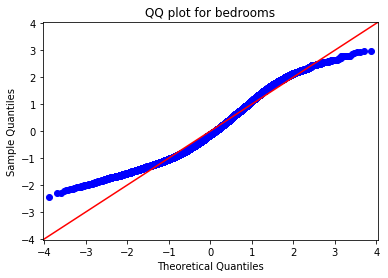

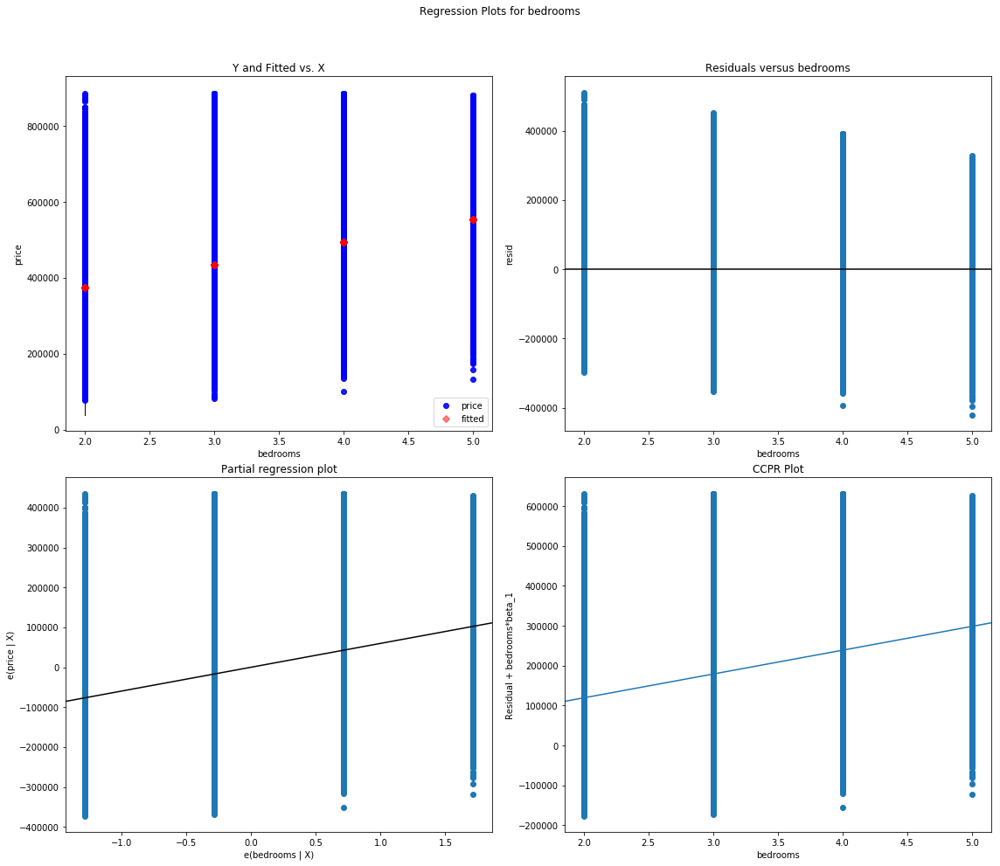

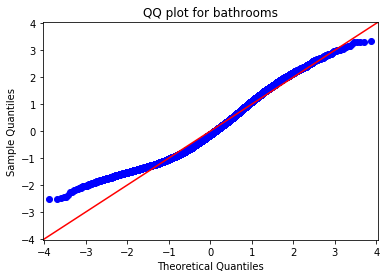

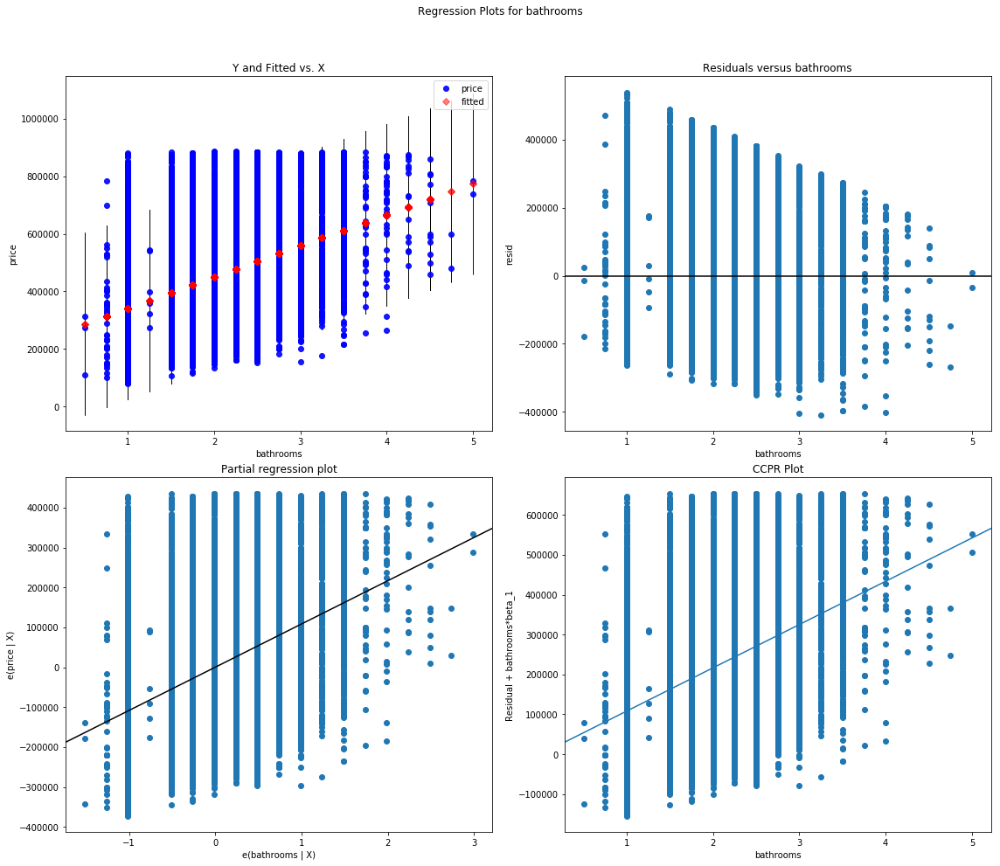

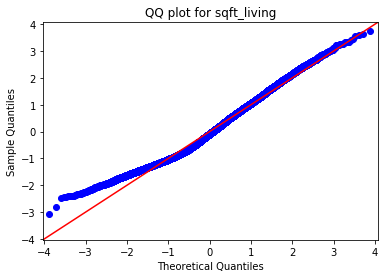

...

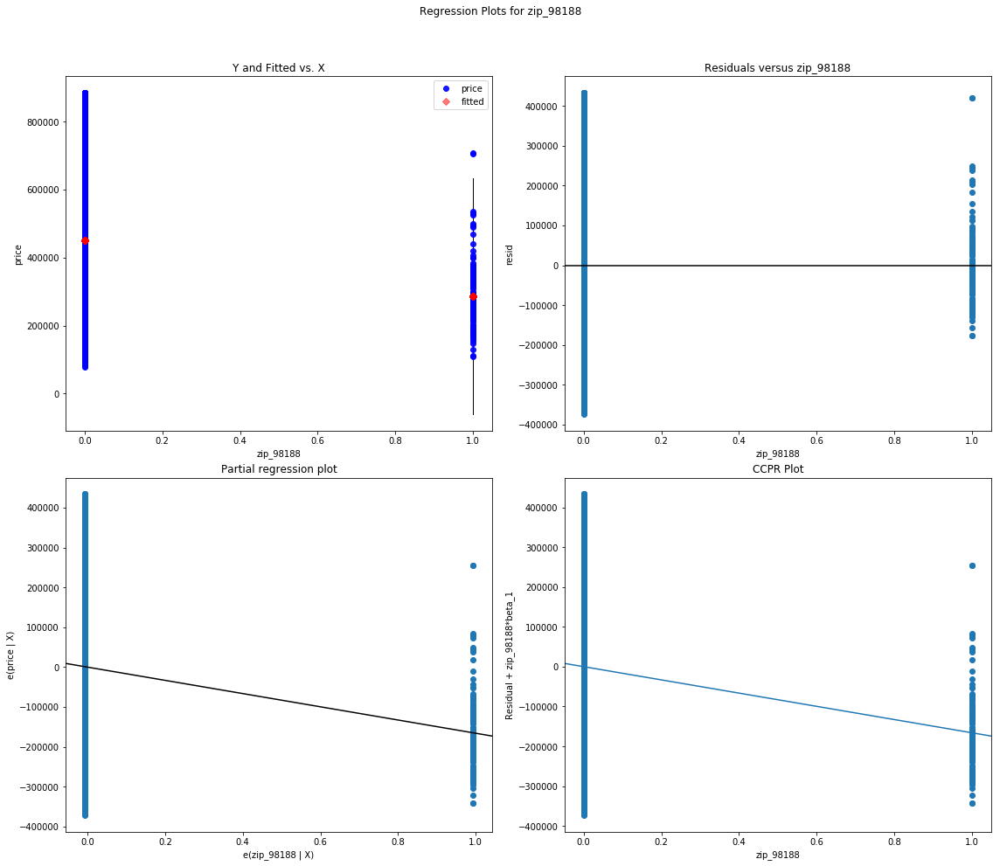

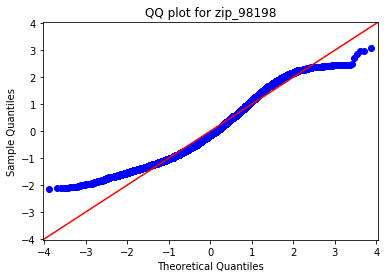

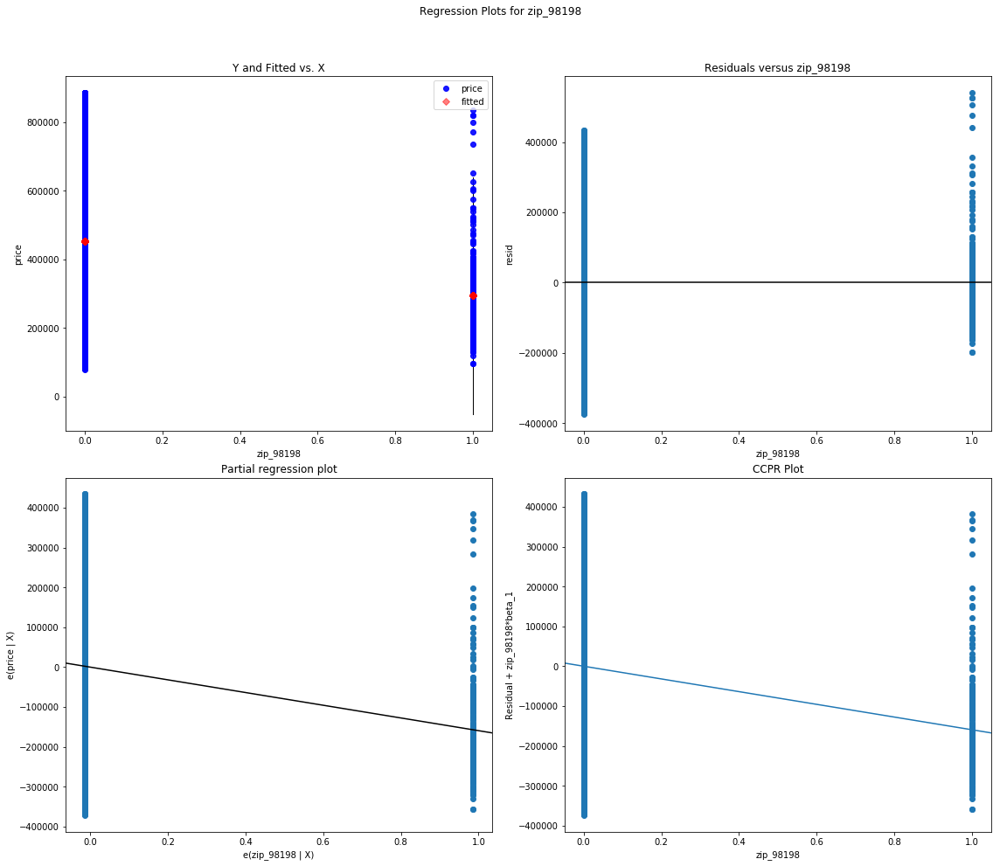

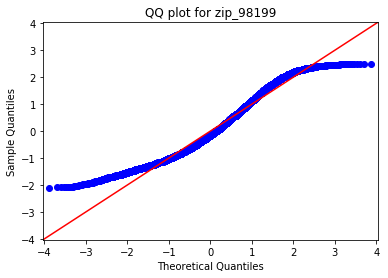

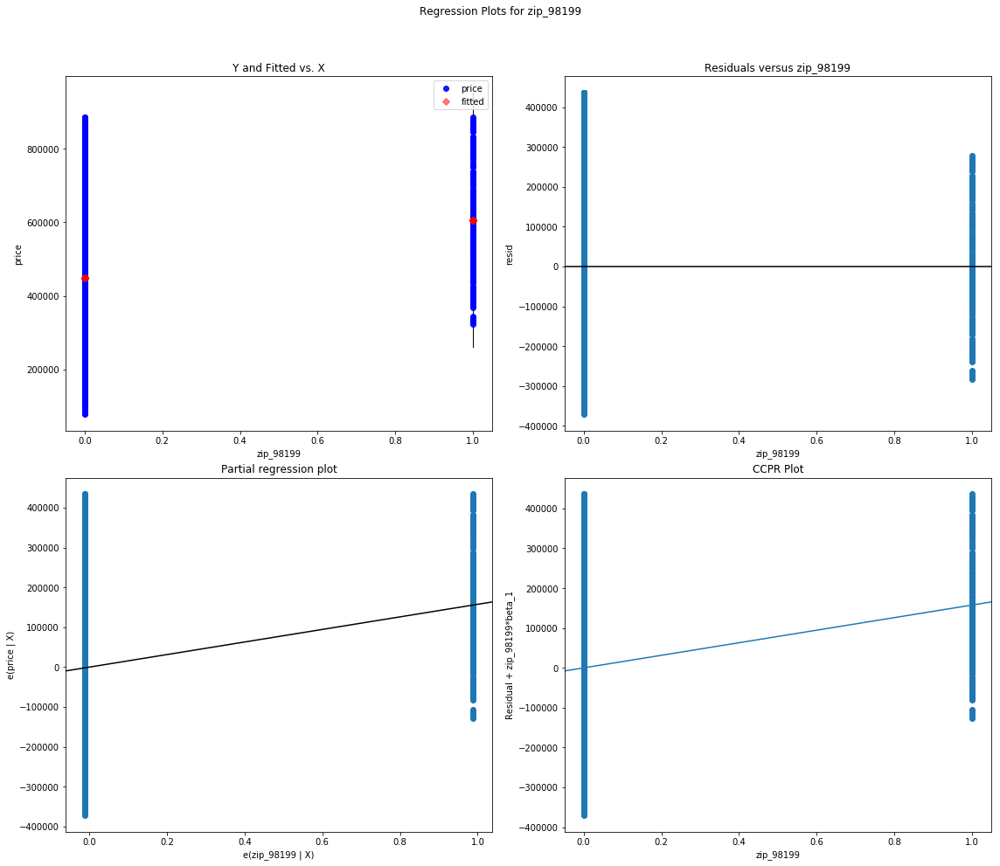

In [117]:
# Import needed package, prep input, and generate Q-Q plots
from scipy import stats

columns_for_qq = mh_zips_encoded_features.columns

for column in columns_for_qq:
    formula = 'price' + '~' + column
    model = ols(formula=formula, data=mh_zips_encoded).fit()
    sm.graphics.qqplot(model.resid, dist=stats.norm, line='45', fit=True)
    plt.title('QQ plot for ' + str(column))
    plt.show();
    fig = plt.figure(figsize=(16,14))
    fig = sm.graphics.plot_regress_exog(model, column, fig=fig)

My residuals definitely aren't perfectly normal, but they aren't too bad for some of the features, like `bedrooms`, `bathrooms`, `sqft_living`, and `grade`. Although there is plenty of room for improvement in my model (and lots that it _can't_ explain, simply because the original data are limited), I think it is worth proceeding to the validation state with this model.

# Validating the model

To ensure that my model could be used to generalize to houses outside my dataset, I will validate it using k-fold cross-validation. Because I am going to use a function from Scikit-Learn for validation, I will first duplicate my model in Scikit-Learn to make things a little easier.

In [122]:
# Import needed sklearn packages
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score

# Initialize and run the regression model using sklearn
linreg = LinearRegression()
linreg.fit(mh_selected, mh_zips_encoded['price'])

-5729117966.714569

In [123]:
# Define a function to call cross_val_score for various k values
def crossval_it(model, features, target, k):
    
    """Find mean of MSE for k folds in cross-validation
    model: your linear model, preferably a LinearRegression() object
    features: a DataFrame of just your features
    target: a DataFrame of just your target
    k: number of folds for cross-validation
    Dependencies: numpy, sklearn.metrics.mean_squared_error, 
    sklearn.metrics.cross_val_score"""
    
    result = np.mean(cross_val_score(model, features, target, cv=k, 
                                      scoring='neg_mean_squared_error'))
    return result

In [129]:
# Define a function to compare k-fold cross-validation results at various
# values of k
def compare_k_folds(model, features, target, folds_list):
    
    """Print MSE for k-fold cross-validation with various k values
    model: your linear model, preferably a LinearRegression() object
    features: a DataFrame of just your features
    target: a DataFrame of just your target
    folds_list: a list of numbers of folds (k) to use in cross-
    validation
    Dependencies: numpy, sklearn.metrics.mean_squared_error, 
    sklearn.metrics.cross_val_score"""
    
    for fold in folds_list:
        mean_mse = crossval_it(model, features, target, fold)
        
        print('{} folds: {}'.format(fold, mean_mse))

In [130]:
# Call compare_k_folds for 5, 10, and 20 folds
folds = [5, 10, 20]

compare_k_folds(linreg, mh_selected, mh_zips_encoded['price'], folds)

5 folds: -5729117966.714569
10 folds: -5722862137.233953
20 folds: -5698285685.955608


The results for 5, 10, and 20-fold cross-validation above are mean squared errors. Taking the square root of each of these (root mean squared error or RMSE), I can see that, while my model doesn't predict price perfectly, at least it is pretty consistent. 

In [132]:
rmse_5 = np.sqrt(abs(crossval_it(linreg, mh_selected, 
                                 mh_zips_encoded['price'], 5)))
rmse_5

75690.9371504579

In [134]:
# Define a function to compare RMSE for k-fold cross-validation at
# various k values
def compare_rmse(model, features, target, folds_list):
    
    """Compare RMSE for k-fold cross-validation results at various values
    of k.
    model: your linear model, preferably a LinearRegression() object
    features: a DataFrame of just your features
    target: a DataFrame of just your target
    folds_list: a list of numbers of folds (k) to use in cross-
    validation
    Dependencies: numpy, sklearn.metrics.mean_squared_error, 
    sklearn.metrics.cross_val_score"""
    
    for fold in folds_list:
        rmse = np.sqrt(abs(crossval_it(model, features, target, fold)))
        print('{} folds: {}'.format(fold, rmse))

In [135]:
# Call compare_rmse for 5, 10, and 20 folds
compare_rmse(linreg, mh_selected, mh_zips_encoded['price'], folds)

5 folds: 75690.9371504579
10 folds: 75649.60103816776
20 folds: 75486.99017682191


The benefit to looking at RMSE is that is it in the same units as the target; since our target is price and it hasn't been transformed in any way, RMSE can be expressed in dollars. As we cross-validate with more and more folds, RMSE stays pretty consistent, varying by only \$204 from 5 to 20 folds. From this validation process I conclude that, although my model doesn't explain all the variation in price, it does its job consistently; its successes are not all random or lucky.

In the "Interpretation" section below, I will wrap up with a summary of how my model can help middle-income families understand the factors that influence the price of a home they want to buy or sell.

# Interpretation

My purpose in analyzing the King County Housing dataset was to extract insights that would help middle-income families understand the factors influencing the prices of homes they want to buy or sell. 

From the original dataset I eliminated the top 10% most expensive homes and then selected only homes with two to five bedrooms. This filtering left 18,999 observations for my analysis, with a median home price of \$425,000, an affordable price for a family earning King County's median household income.

Examining a few features in isolation, I was able to observe the following:
* The time of year may have an impact on sale price. Median sale prices in the months of April, May, June, and July tend to be higher than those at other times of year. For instance, April's median home price is \$41,000 higher than January's.
* The number of bedrooms may be a good indicator of sale price, and adding a bedroom cause a substantial increase in the sale price of a home. For instance, adding a fourth bedroom to a three-bedroom house could cause up to a 22% increase in sale price.
* Similarly, improving the grade of a house could have a substantial impact on price. For instance, raising a house's grade from 7 to 8 could raise the sale price by over \$126,000.

It is important to note that the above observations are based on considering features in isolation, but in reality, the features in this dataset are probably related to one another in ways that affect the target (price). For instance, adding a bedroom probably means increasing a home's square footage at the same time, and if the new bedroom improves the design of the home, the grade may also increase. 

My multiple linear regression model can offer more precise insights on the impacts of various features on price. I fit the model to a version of my dataset that used one-hot encoding on zipcodes, and I used stepwise feature selection to eliminate features that were not having a significant impact on price. The resulting model explains 82\% of the variability in price. 

Specifically, the model coefficients show that:
* Adding a bathroom or increasing square footage by 100 square feet could raise the price of a home by over \$8,300.
* Improving the condition of a home by one level (e.g., from 3 to 4) could raise the price of the home by over \$21,000.
* Improving the grade of a home by one level (e.g., from 7 to 8) could raise the price of the home by over \$42,000.

The dollar values cited here are likely to be much more accurate than those above because they take into account the effects of many features on price, not just one at a time. 

There are many factors influencing the price of a home, not all of which are within a homeowner's control. There are also many potential factors affecting price that the original dataset did not consider, such as a home's school district, or the walkability of the neighborhood, or the distance to major employment centers. My model indicates, however, that there are some concrete steps a homeowner can take to raise the potential sale price of a home, including improvements to amenities and design.